# Dependencies and files

## Install dependencies

## Imports

In [1]:
import warnings
import scanpy as sc
import anndata as an
import pandas as pd
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns
import os

sc.settings.set_figure_params(dpi=80)
#sc.set_figure_params(facecolor="white", figsize=(8, 8))
warnings.simplefilter(action='ignore', category=FutureWarning)
sc.settings.verbosity = 3

# Global variables

In [2]:
de_dir_path = './results/'

In [3]:
os.makedirs('figures//heatmaps', exist_ok=True)
os.makedirs('figures/snakeplots', exist_ok=True)

In [4]:
os.listdir(de_dir_path)

['anova_mamm_zscore.csv',
 'cluster_spectr_anova_6.csv',
 'cluster_spectr_anova_7.csv',
 'cluster_spectr_anova_8.csv',
 'cluster_spectr_anova_9.csv',
 'pb_mammals_filtered.h5ad',
 'pb_mammals_samplenorm_zscore.h5ad',
 'ttest_human_monkey_zscore.csv',
 'ttest_mamm_zscore.csv']

In [5]:
layers = ['L1', 'L2', 'L3', 'L4', 'L5', "L6", 'WM']
cluster_color = ['red', 'blue', 'green',  'yellow', 'orange', 'purple', 'olive', 'pink', 'brown']
clusters_labels = ['A', 'B', 'C', 'D', 'E', 'F', 'G', 'H', 'I']

### DE results

In [6]:
anova_res = pd.read_csv(de_dir_path + 'anova_mamm_zscore.csv', index_col=0)
anova_genes = anova_res[anova_res.p_val_adj < 0.05].index
anova_res.head()

,sum_sq,df,F,PR(>F),p_val_adj
A1BG,16.406416,12.0,2.634814,0.005952,0.024619
AAAS,11.650260,12.0,1.203083,0.299204,0.420750
AACS,7.838514,12.0,1.515760,0.140030,0.245693
AADAT,11.017066,12.0,1.720198,0.081496,0.166637
AAGAB,13.101968,12.0,1.491386,0.149069,0.256374


In [7]:
ttest_res = pd.read_csv(de_dir_path + 'ttest_mamm_zscore.csv', index_col=0)
ttest_res.head()

,gene,layer,group1,group2,score,pvalue,p_val_adj
0,A1BG,L1,human,chimp,-2.069551,0.083940,0.280856
1,AARS1,L1,human,chimp,-0.106135,0.918935,0.963909
2,AATK,L1,human,chimp,-0.913974,0.395973,0.625443
3,ABAT,L1,human,chimp,0.435186,0.678645,0.828286
4,ABCA2,L1,human,chimp,-0.600076,0.570409,0.752111


## Load normalized pseudobulks

In [8]:
pb_dir_path = './results/'

In [9]:
os.listdir(pb_dir_path)

['anova_mamm_zscore.csv',
 'cluster_spectr_anova_6.csv',
 'cluster_spectr_anova_7.csv',
 'cluster_spectr_anova_8.csv',
 'cluster_spectr_anova_9.csv',
 'pb_mammals_filtered.h5ad',
 'pb_mammals_samplenorm_zscore.h5ad',
 'ttest_human_monkey_zscore.csv',
 'ttest_mamm_zscore.csv']

In [10]:
adata_pb_norm = sc.read_h5ad(pb_dir_path + 'pb_mammals_samplenorm_zscore.h5ad')
adata_pb_norm.var = anova_res
adata_pb_norm

AnnData object with n_obs × n_vars = 89 × 9208
    obs: 'layer', 'sample_id', 'psbulk_n_cells', 'psbulk_counts', 'condition', 'lib_size', 'log_lib_size'
    var: 'sum_sq', 'df', 'F', 'PR(>F)', 'p_val_adj'
    uns: 'log1p', 'pca'
    obsm: 'X_pca'
    varm: 'PCs'
    layers: 'psbulk_props'

# Visualisation

## PCA

In [11]:
adata_norm_anova = adata_pb_norm[:, adata_pb_norm.var.p_val_adj < 0.05]
df = pd.DataFrame(adata_norm_anova.X, columns=adata_norm_anova.var_names, index=adata_norm_anova.obs_names)
df.head()

,A1BG,AARS1,AATK,ABAT,ABCA2,ABCA3,ABCB1,ABCC8,ABCD2,ABCD4,...,ZNF770,ZNF771,ZNF791,ZNFX1,ZNHIT3,ZSCAN26,ZSWIM6,ZSWIM7,ZWILCH,ZYX
chimp_11454_L1,0.067607,0.048899,-0.866878,0.941001,-0.584219,0.225061,2.164955,-1.727813,-1.808496,1.097898,...,-1.144999,1.003143,2.034890,2.120513,0.304388,0.807150,-0.605884,-1.395130,0.766767,2.119675
chimp_13309_L1,-0.620890,0.551155,-0.524649,-0.493878,-0.377964,0.768584,1.852353,-1.929787,1.759512,-0.487258,...,1.634686,1.863968,-0.278358,-1.439896,1.413479,-0.717389,2.147622,-0.679872,-0.496705,-0.377964
chimp_j8_L1,0.180522,0.714291,-0.226999,-0.593612,-0.377964,-0.980421,1.759291,-1.135551,1.073752,0.697122,...,0.166248,1.891804,1.973455,0.324671,-0.818207,-0.718917,-0.542437,0.406670,-0.278057,-0.983870
human_759_L1,-1.331822,-0.647242,-0.826818,1.271917,-1.941428,-1.319931,1.139539,-0.980215,-0.706254,0.335568,...,-1.629407,-0.046980,-0.616084,-1.415386,-0.530492,1.290073,0.461636,-0.452875,-1.887467,1.315433
human_j12_L1,-0.233744,-1.010445,-0.894322,0.773044,-1.481495,-0.648619,1.413186,0.185717,1.253298,1.399050,...,-0.056591,-0.533302,0.043702,1.234824,-0.009000,-0.448790,-0.352265,1.806208,-1.789864,0.664080


In [12]:
human_specific_genes = ttest_res[(ttest_res.group1 == 'human') & (ttest_res.p_val_adj < 0.05)].gene.unique().tolist()
df_hs = df[human_specific_genes].copy()
df_hs.head()

,ACBD6,ADCY1,ADGRB3,ANKRD34A,ANKS1B,ARID5A,ATL3,BASP1,CASC3,CASKIN1,...,VRK1,VXN,WDFY3,YARS1,YJEFN3,ZC3H15,ZFPM2,ZNF385B,ZNF655,ZSWIM7
chimp_11454_L1,0.176723,0.000000,1.722028,0.000000,0.276261,1.809440,-0.667427,0.463941,-0.728520,-0.696387,...,1.717193,-1.134289,0.999735,-1.923042,-0.561517,-0.245206,-0.915201,0.997998,-0.990830,-1.395130
chimp_13309_L1,-0.211324,0.000000,2.105158,-0.727547,1.222371,1.156610,-0.377964,1.307752,-0.546532,-0.574759,...,-1.843145,-1.317791,-1.769172,-1.858351,0.000000,-1.725223,1.167942,-1.490637,1.228580,-0.679872
chimp_j8_L1,-0.441404,0.000000,1.583694,0.000000,0.652413,1.300756,-1.708752,-0.521026,-1.443443,-0.797879,...,0.921410,-1.281834,0.085413,-0.800627,0.000000,-0.521305,-0.569266,-0.795815,1.277550,0.406670
human_759_L1,1.265363,-1.939089,-2.045145,-1.868541,-2.055515,0.100319,2.165115,-2.217301,1.985024,1.776437,...,-1.033172,-0.521248,-0.274949,-1.204073,-1.373579,-1.640325,-1.281023,-1.619944,-0.648235,-0.452875
human_j12_L1,1.574184,-1.564128,-1.551406,-1.923022,-1.629232,-0.493158,1.280992,-1.642719,1.608431,1.864293,...,1.905657,-1.726418,-1.266871,-1.876087,-0.947666,-0.454664,-1.189340,-0.842430,0.761098,1.806208


In [13]:
sample_order = dict()
for cond in ['human', 'chimp', 'macaque']:
    samples = df.loc[df.index.str.contains(cond)].index
    order = sorted(samples.tolist(), key=lambda x: x[-2:])
    order_laminar = list(filter(lambda x: 'L' in x, order))
    order_wm = list(filter(lambda x: 'WM' in x, order))
    sample_order[cond] = order_wm + order_laminar
sample_order['all'] = sample_order['human'] + sample_order['chimp'] + sample_order['macaque']
df = df.loc[sample_order['all']]
df_hs = df_hs.loc[sample_order['all']]

In [14]:
import plotly.express as px
from sklearn.decomposition import PCA

pca = PCA(n_components=2)
components = pca.fit_transform(adata_pb_norm.X.T)

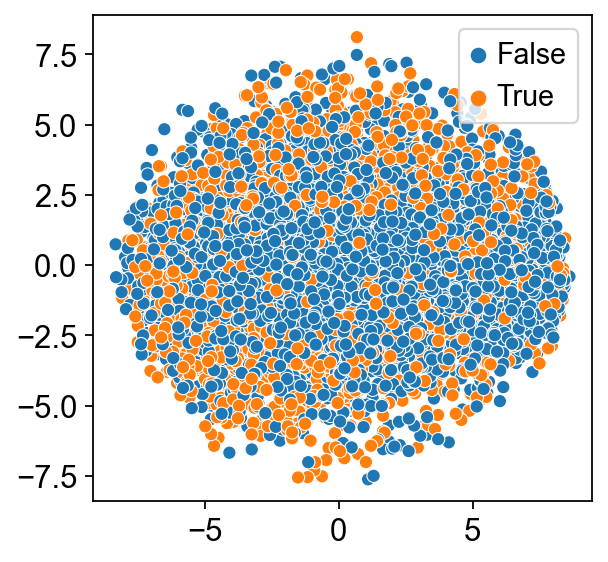

In [15]:
sns.scatterplot(x=components[:, 0], y=components[:, 1], hue=(adata_pb_norm.var.p_val_adj < 0.05).values)
plt.grid(False)

# Clusterisation of the ANOVA significant genes

## Hierarchal clustering

D:\Projects\spatialMPFC\venv\lib\site-packages\seaborn\matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


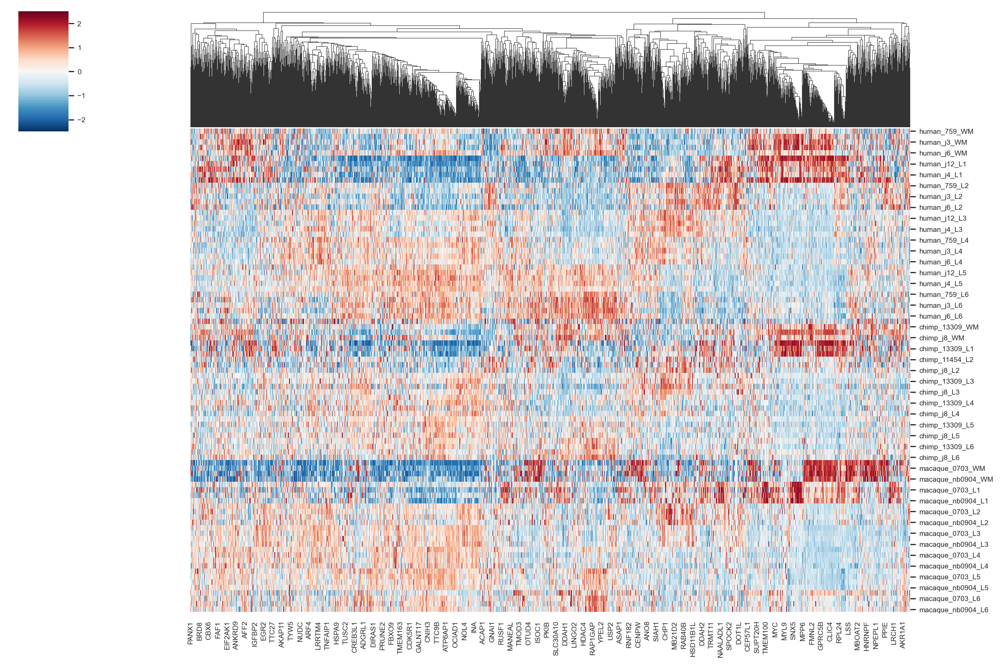

In [16]:
sns.set(font_scale=0.7)
sns.clustermap(df, figsize=(15, 10), cmap="RdBu_r", center=0, vmax=2.5, vmin=-2.5, metric='cosine', annot_kws={"size": 2}, row_cluster=False).savefig('figures/heatmaps/clustermap_anova.png')

Clusterization for each layer

D:\Projects\spatialMPFC\venv\lib\site-packages\seaborn\matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
D:\Projects\spatialMPFC\venv\lib\site-packages\seaborn\matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
D:\Projects\spatialMPFC\venv\lib\site-packages\seaborn\matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
D:\Projects\spatialMPFC\venv\lib\site-packages\seaborn\matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
D:\Projects\spatialMPFC\venv\lib\site-packages\seaborn\matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
D:\Projects\spatialMPFC\venv\l

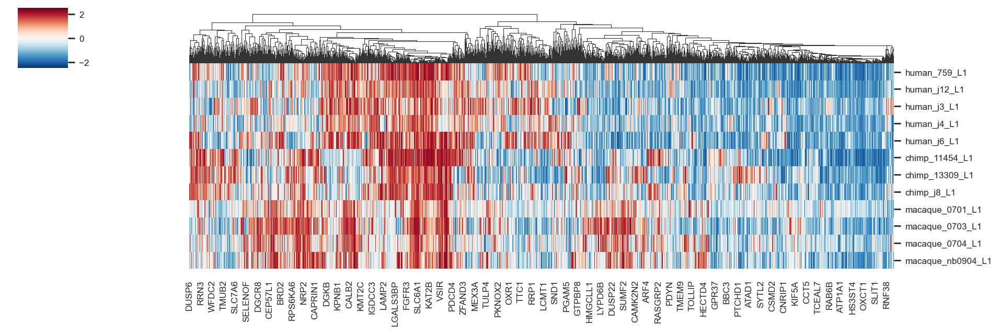

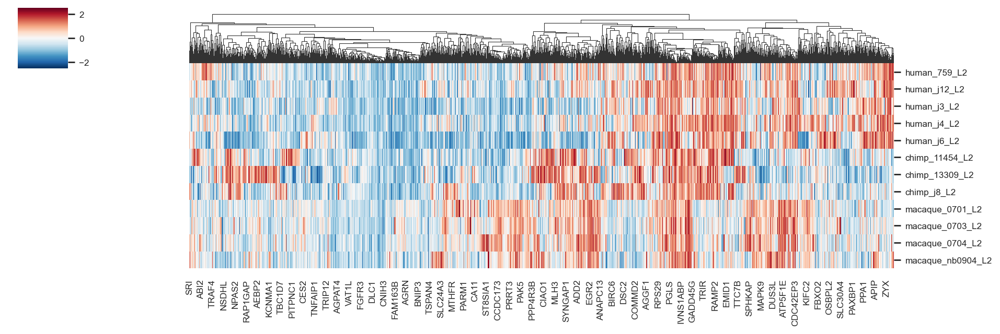

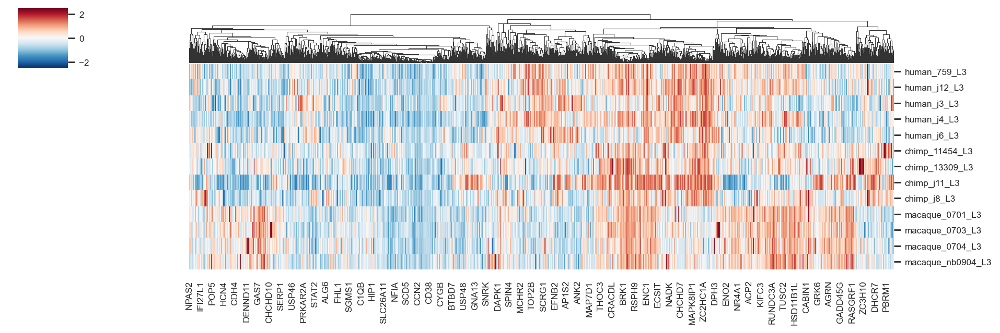

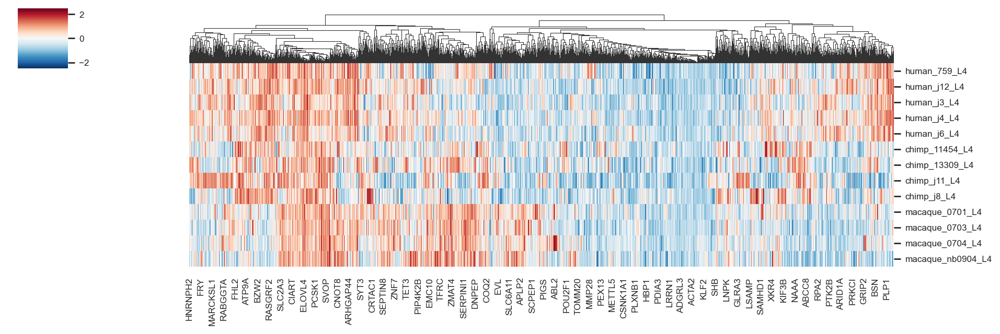

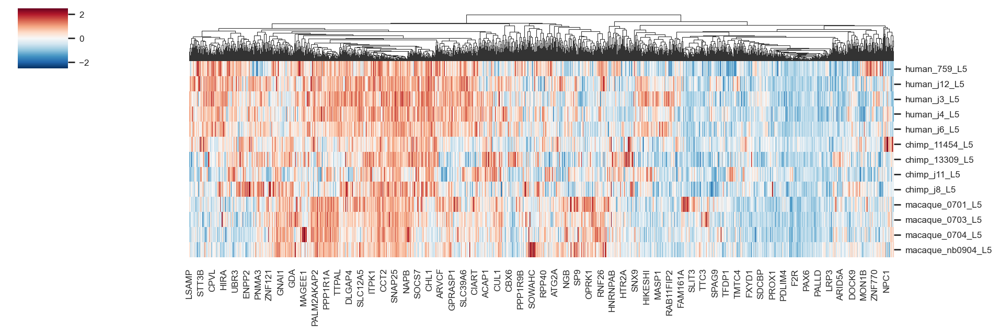

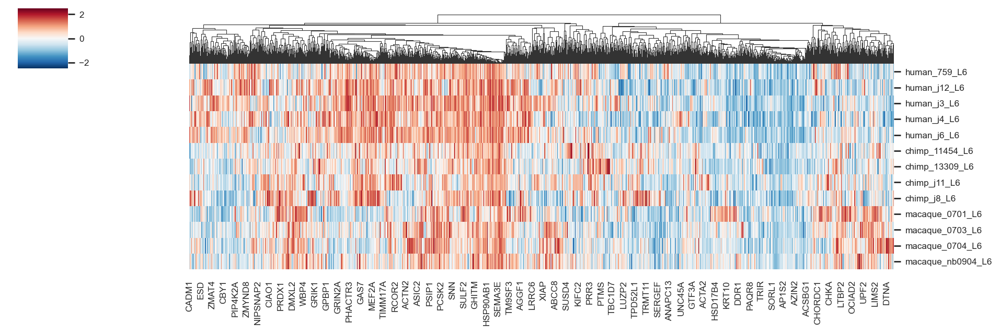

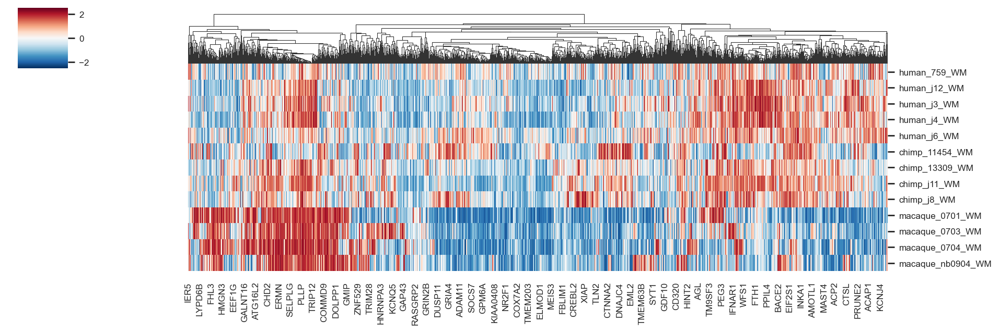

In [17]:
for layer in ['L1', 'L2', 'L3', 'L4', 'L5', 'L6', 'WM']:
    df_layer = df.loc[df.index.str.contains(layer)]
    sns.clustermap(df_layer, figsize=(12, 4), cmap="RdBu_r", center=0,
                   vmax=2.5, vmin=-2.5, metric='cosine',
                   annot_kws={"size": 2}, row_cluster=False)

Clusterisation for each specie

D:\Projects\spatialMPFC\venv\lib\site-packages\seaborn\matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
D:\Projects\spatialMPFC\venv\lib\site-packages\seaborn\matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
D:\Projects\spatialMPFC\venv\lib\site-packages\seaborn\matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


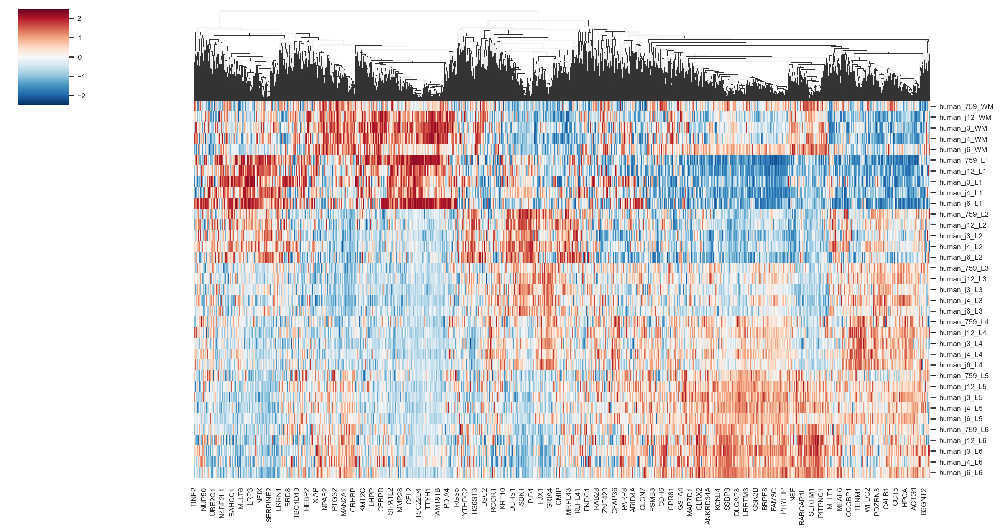

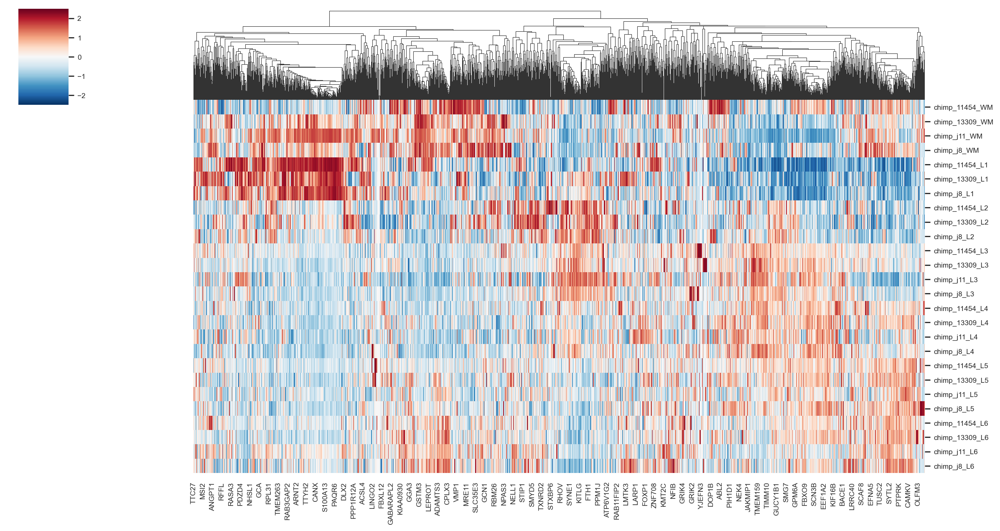

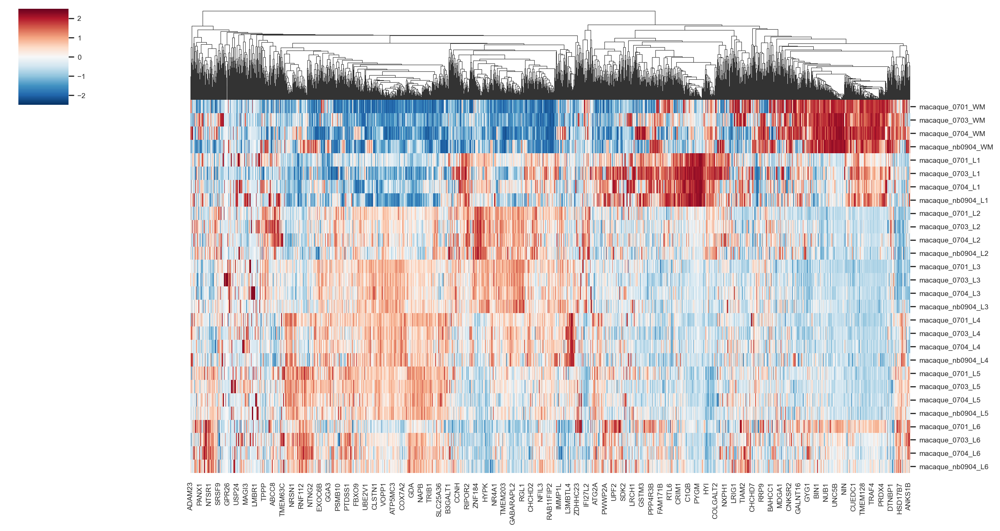

In [18]:
for cond in ['human', 'chimp', 'macaque']:
    df_cond = df.loc[df.index.str.contains(cond)]
    max_val = df_cond.max(axis=0).sort_values()
    df_cond = df_cond[max_val[max_val > 0].index.tolist()]
    sns.clustermap(df_cond, figsize=(15, 8), cmap="RdBu_r", center=0,
                   vmax=2.5, vmin=-2.5, metric='cosine',
                   annot_kws={"size": 2}, row_cluster=False)

## Spectral clustering

### 6 clusters

#### Clustering

In [19]:
from sklearn.cluster import SpectralClustering
from sklearn.metrics.pairwise import pairwise_kernels
aff_matrix = pairwise_kernels(df.T, metric='cosine') + 1
n_clusters = 6
clustering = SpectralClustering(n_clusters=n_clusters, gamma=1, affinity='precomputed', random_state=4)
clustering.fit(aff_matrix)

SpectralClustering(affinity='precomputed', gamma=1, n_clusters=6,
                   random_state=4)

In [20]:
cl_order = {i: a for i, a in enumerate([1, 4, 3, 2, 0, 5])}
labels = pd.Series(clustering.labels_, index=df.columns).map(cl_order).sort_values()
order = labels.sort_values().index
labels.to_csv(de_dir_path + f'cluster_spectr_anova_zscore_{n_clusters}.csv')

#### Heatmap

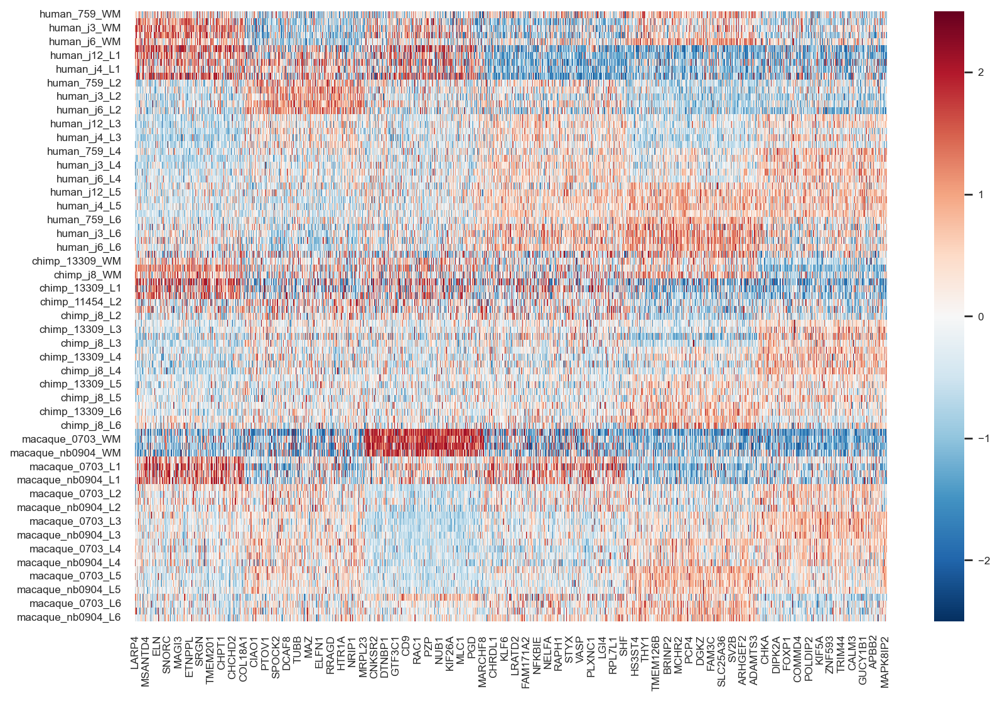

In [21]:
sns.set(font_scale=0.7)
fig, ax = plt.subplots(figsize=(12, 8))
sns.heatmap(df.loc[sample_order['all'], order], ax=ax, cmap="RdBu_r", vmax=2.5, vmin=-2.5, center=0)
plt.savefig(f'figures/heatmaps/heatmap_spectr{n_clusters}_anova.png', bbox_inches='tight')

#### Heatmap for each layer

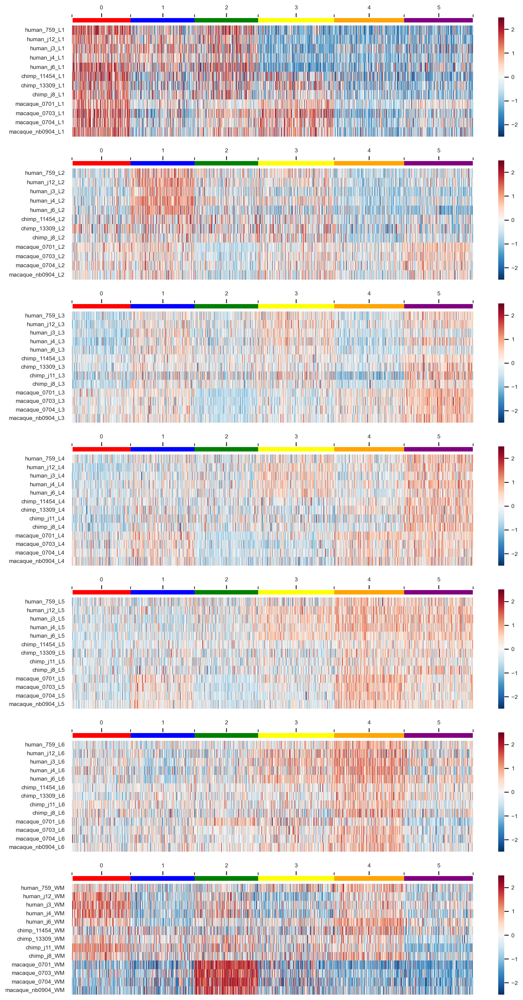

In [22]:
from matplotlib.patches import bbox_artist
from mpl_toolkits.axes_grid1 import make_axes_locatable
from matplotlib import ticker

clusters = np.arange(n_clusters)
colors = cluster_color[:n_clusters]
fig, axes = plt.subplots(7, 1, figsize=(12, 4 * n_clusters), gridspec_kw={'hspace': 0.2})

for ax, layer in zip(axes.flatten(), layers):
    df_layer = df.loc[df.index.str.contains(layer)]
    sns.heatmap(df_layer.loc[:, order], ax=ax, cmap="RdBu_r", vmax=2.5, vmin=-2.5, center=0, xticklabels=False)
    # colorbar
    divider = make_axes_locatable(ax)
    cax = divider.append_axes('top', size='5%', pad=0.05)
    cmap = mpl.colors.ListedColormap(colors)

    cluster_size = labels.value_counts().loc[clusters].values
    cluster_pos = cluster_size.cumsum()
    bounds = [0] + list(cluster_pos)
    norm = mpl.colors.BoundaryNorm(bounds, cmap.N)
    fig.colorbar(
        mpl.cm.ScalarMappable(cmap=cmap, norm=norm),
        cax=cax,
        ticks=bounds,
        orientation='horizontal',
        spacing='proportional'
    )
    cax.xaxis.set_major_locator(ticker.FixedLocator(cluster_pos - cluster_size / 2))
    cax.xaxis.set_major_formatter(ticker.FixedFormatter(clusters))
    cax.xaxis.tick_top()

#### Snakeplot for each layer

In [23]:
df_annotation = df.copy()
df_annotation['layer'] = adata_norm_anova.obs.layer
df_annotation['condition'] = adata_norm_anova.obs.condition

In [24]:
layer_mean = df_annotation.groupby(['condition', 'layer']).mean()
layer_mean.head()

A1BG     AARS1      AATK      ABAT     ABCA2     ABCA3  \
condition layer                                                               
chimp     L1    -0.124254  0.438115 -0.539509 -0.048830 -0.446716  0.004408   
          L2    -0.601969 -0.610583 -1.150563 -0.865423 -0.446716 -1.078788   
          L3     1.322821 -0.184341  0.164686 -0.757013  0.023459 -0.281512   
          L4     1.045246 -0.346950  0.145362  0.606082  0.117506 -0.005355   
          L5    -0.120974 -0.162974  0.883652  1.146056 -0.061804 -0.141554   

                    ABCB1     ABCC8     ABCD2     ABCD4  ...    ZNF770  \
condition layer                                          ...             
chimp     L1     1.925533 -1.597717  0.341589  0.435920  ...  0.218645   
          L2    -0.617952  1.198276  0.032164  1.432714  ... -0.350721   
          L3    -0.302529  0.397876  0.860705 -0.573886  ... -0.317873   
          L4    -0.411912  0.219108  0.378155 -0.410210  ... -0.986731   
          L5    -0.508543  0.189006 -0.572668  0.002664  ... -0.419019   

                   ZNF771    ZNF791     ZNFX1    ZNHIT3   ZSCAN26    ZSWIM6  \
condition layer                                                               
chimp     L1     1.586305  1.243329  0.335096  0.299887 -0.209719  0.333100   
          L2    -0.756416 -0.087413  0.343525  0.643968 -0.469103 -0.605761   
          L3     0.357783  0.091345 -0.352491  0.080413 -0.078920 -0.400222   
          L4    -0.224921 -0.709821 -0.297188 -0.253781 -0.613633 -0.398616   
          L5    -0.375516 -0.296824 -0.641171  0.220328 -0.588035 -0.098673   

                   ZSWIM7    ZWILCH       ZYX  
condition layer                                
chimp     L1    -0.556111 -0.002665  0.252614  
          L2     1.347295 -0.335202 -0.645583  
          L3    -0.042495 -0.173643  0.367243  
          L4    -0.126006  0.187544  0.850038  
          L5    -0.732700 -0.598759 -0.293464  

[5 rows x 2836 columns]

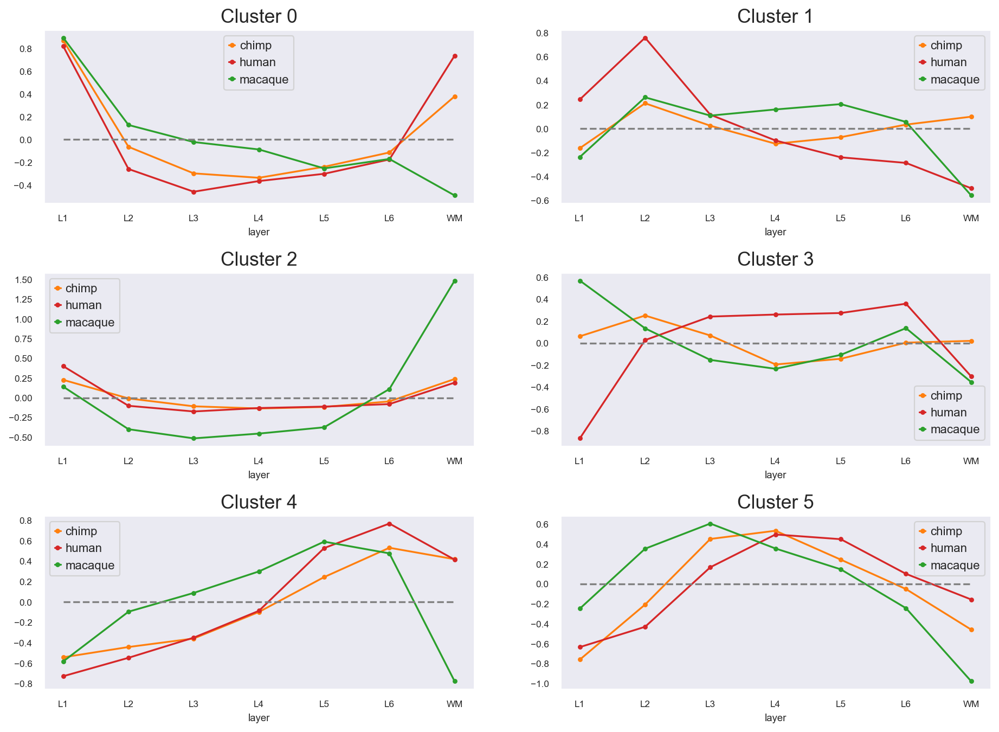

In [25]:
fig, axes = plt.subplots(n_clusters // 2, 2,  figsize=(14, 3.5 * n_clusters // 2), gridspec_kw={'hspace': 0.4})

for label, ax in zip(clusters, axes.flatten()):
    genes = labels[labels == label].index.tolist()

    (
        layer_mean[genes]
        .mean(axis=1)
        .reorder_levels(['layer', 'condition'])
        .unstack().loc[layers]
        .plot
        .line(color={'human': 'tab:red', 'chimp': 'tab:orange', 'macaque': 'tab:green'}, ax=ax, marker='.')
    )
    ax.legend(fontsize=10)
    ax.set_title(f'Cluster {label}', fontsize=16)
    ax.grid(False)
    ax.hlines(0, xmin=0, xmax=6, colors='gray', linestyles='dashed')
plt.savefig(f'figures/snakeplots/snakeplot_layers_mean_only_clusters{n_clusters}.png', bbox_inches='tight')

### 7 clusters

#### Clustering

In [26]:
from sklearn.cluster import SpectralClustering
from sklearn.metrics.pairwise import pairwise_kernels
aff_matrix = pairwise_kernels(df.T, metric='cosine') + 1
n_clusters = 7
clustering = SpectralClustering(n_clusters=n_clusters, gamma=1, affinity='precomputed', random_state=4)
clustering.fit(aff_matrix)

SpectralClustering(affinity='precomputed', gamma=1, n_clusters=7,
                   random_state=4)

In [27]:
cl_order = {i: a for i, a in enumerate([3, 1, 4, 0, 2, 6, 5])}
labels = pd.Series(clustering.labels_, index=df.columns).map(cl_order).sort_values()
order = labels.sort_values().index
labels.to_csv(de_dir_path + f'cluster_spectr_anova_zscore_{n_clusters}.csv')

#### Heatmap

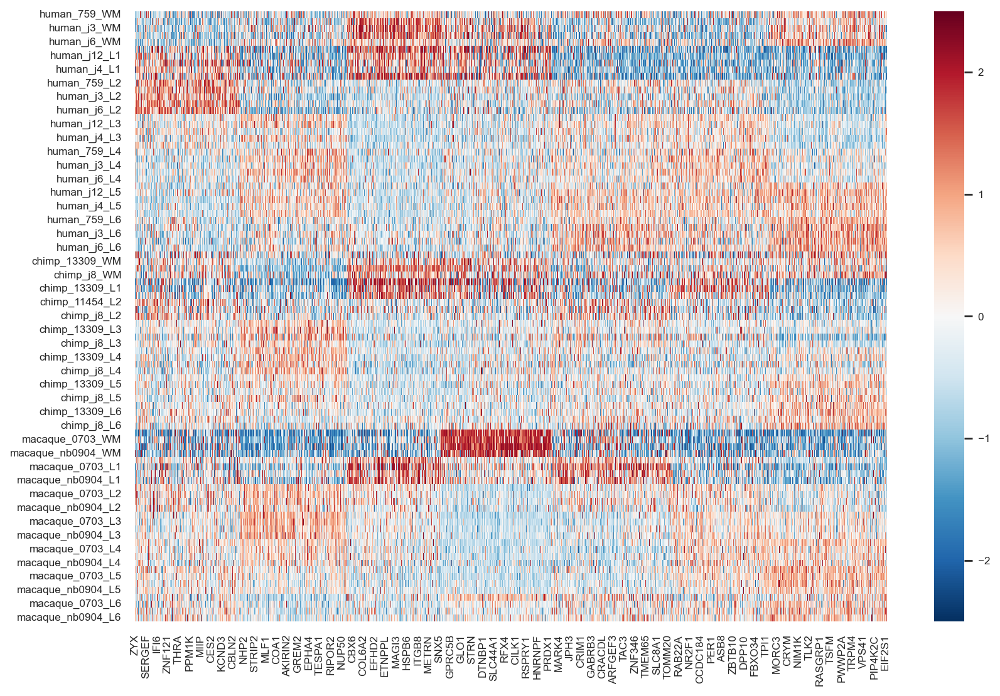

In [28]:
sns.set(font_scale=0.7)
fig, ax = plt.subplots(figsize=(12, 8))
sns.heatmap(df.loc[sample_order['all'], order], ax=ax, cmap="RdBu_r", vmax=2.5, vmin=-2.5, center=0)
plt.savefig(f'figures/heatmaps/heatmap_spectr{n_clusters}_anova.png', bbox_inches='tight')

#### Heatmap for each layer

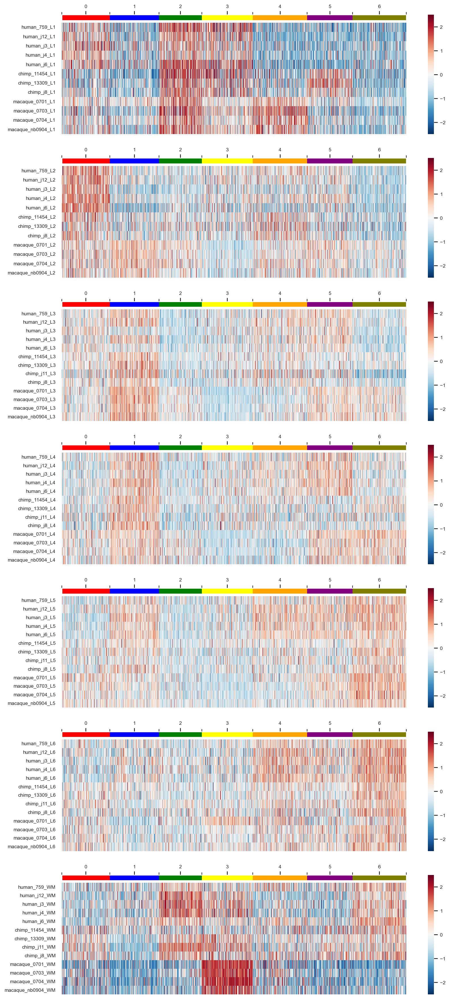

In [29]:
from matplotlib.patches import bbox_artist
from mpl_toolkits.axes_grid1 import make_axes_locatable
from matplotlib import ticker

clusters = np.arange(n_clusters)
colors = cluster_color[:n_clusters]
fig, axes = plt.subplots(7, 1, figsize=(12, 4 * n_clusters), gridspec_kw={'hspace': 0.2})

for ax, layer in zip(axes.flatten(), layers):
    df_layer = df.loc[df.index.str.contains(layer)]
    sns.heatmap(df_layer.loc[:, order], ax=ax, cmap="RdBu_r", vmax=2.5, vmin=-2.5, center=0, xticklabels=False)
    # colorbar
    divider = make_axes_locatable(ax)
    cax = divider.append_axes('top', size='5%', pad=0.05)
    cmap = mpl.colors.ListedColormap(colors)

    cluster_size = labels.value_counts().loc[clusters].values
    cluster_pos = cluster_size.cumsum()
    bounds = [0] + list(cluster_pos)
    norm = mpl.colors.BoundaryNorm(bounds, cmap.N)
    fig.colorbar(
        mpl.cm.ScalarMappable(cmap=cmap, norm=norm),
        cax=cax,
        ticks=bounds,
        orientation='horizontal',
        spacing='proportional'
    )
    cax.xaxis.set_major_locator(ticker.FixedLocator(cluster_pos - cluster_size / 2))
    cax.xaxis.set_major_formatter(ticker.FixedFormatter(clusters))
    cax.xaxis.tick_top()

#### Snakeplot for each layer

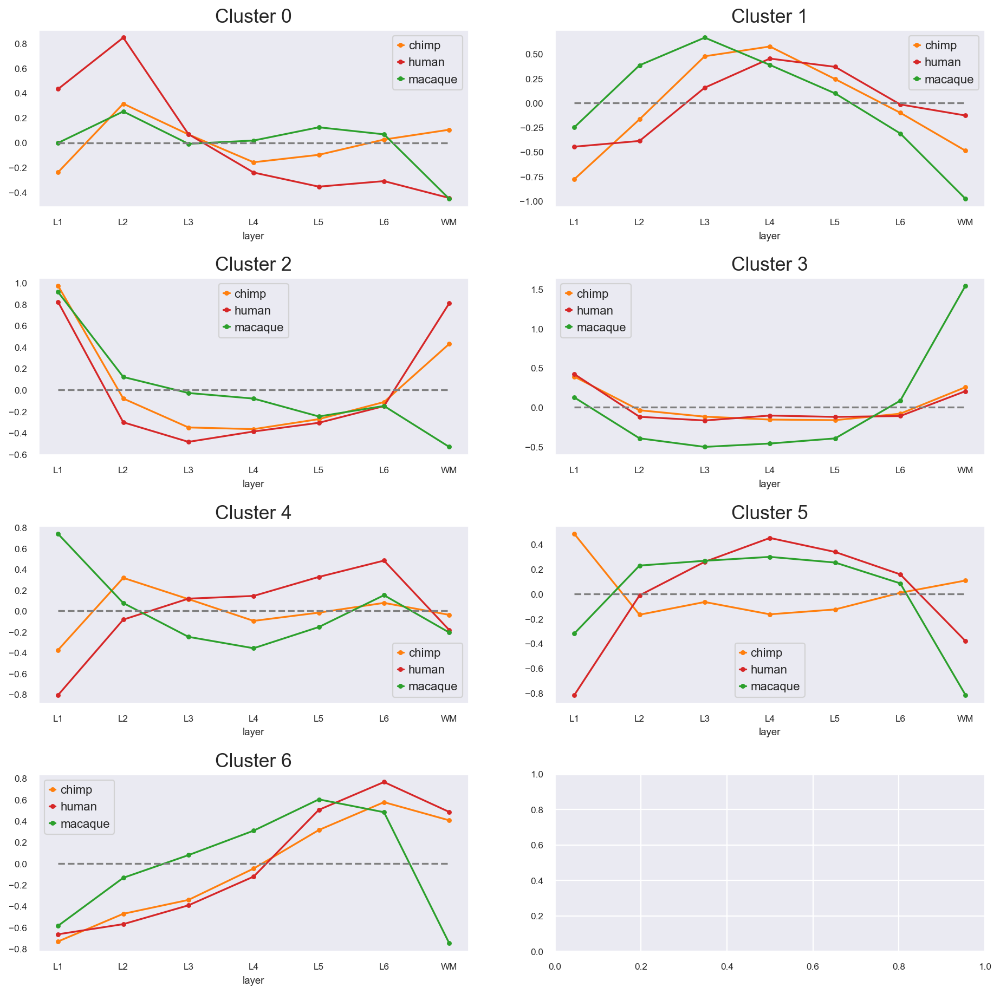

In [30]:
n_rows = (n_clusters // 2 + n_clusters % 2)
fig, axes = plt.subplots(n_rows, 2,  figsize=(14, 3.5 * n_rows), gridspec_kw={'hspace': 0.4})

for label, ax in zip(clusters, axes.flatten()):
    genes = labels[labels == label].index.tolist()

    (
        layer_mean[genes]
        .mean(axis=1)
        .reorder_levels(['layer', 'condition'])
        .unstack().loc[layers]
        .plot
        .line(color={'human': 'tab:red', 'chimp': 'tab:orange', 'macaque': 'tab:green'}, ax=ax, marker='.')
    )
    ax.legend(fontsize=10)
    ax.set_title(f'Cluster {label}', fontsize=16)
    ax.grid(False)
    ax.hlines(0, xmin=0, xmax=6, colors='gray', linestyles='dashed')
plt.savefig(f'figures/snakeplots/snakeplot_layers_mean_only_clusters{n_clusters}.png', bbox_inches='tight')

### 8 clusters

#### Clustering

In [31]:
from sklearn.cluster import SpectralClustering
from sklearn.metrics.pairwise import pairwise_kernels
aff_matrix = pairwise_kernels(df.T, metric='cosine') + 1
n_clusters = 8
clustering = SpectralClustering(n_clusters=n_clusters, gamma=1, affinity='precomputed', random_state=4)
clustering.fit(aff_matrix)

SpectralClustering(affinity='precomputed', gamma=1, random_state=4)

In [32]:
cl_order = {i: a for i, a in enumerate([7, 5, 2, 4, 1, 0, 6, 3])}
labels = pd.Series(clustering.labels_, index=df.columns).map(cl_order).sort_values()
order = labels.sort_values().index
labels.to_csv(de_dir_path + f'cluster_spectr_anova_zscore_{n_clusters}.csv')

#### Heatmap

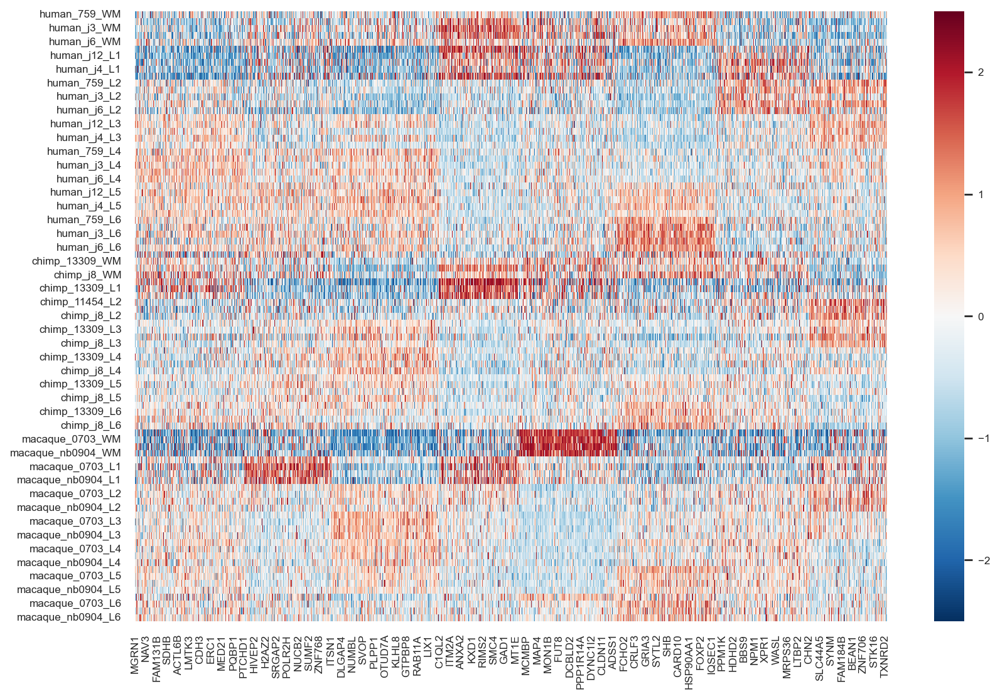

In [33]:
sns.set(font_scale=0.7)
fig, ax = plt.subplots(figsize=(12, 8))
sns.heatmap(df.loc[sample_order['all'], order], ax=ax, cmap="RdBu_r", vmax=2.5, vmin=-2.5, center=0)
plt.savefig(f'figures/heatmaps/heatmap_spectr{n_clusters}_anova.png', bbox_inches='tight')

#### Heatmap for each layer

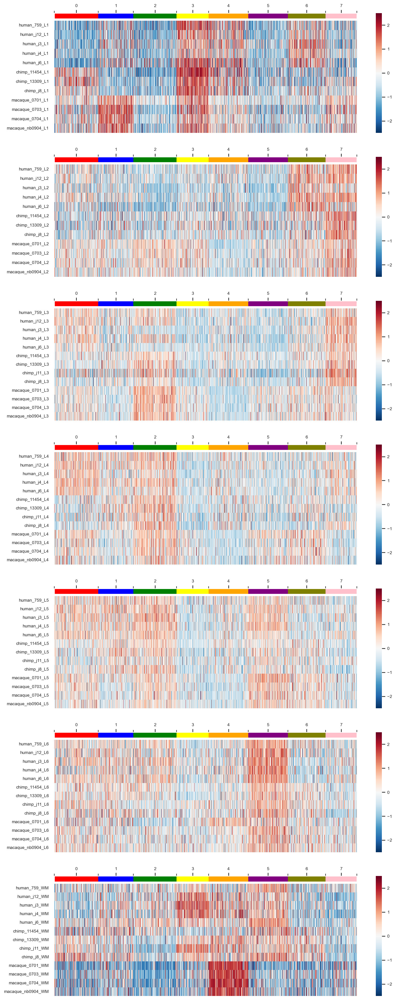

In [34]:
from matplotlib.patches import bbox_artist
from mpl_toolkits.axes_grid1 import make_axes_locatable
from matplotlib import ticker

clusters = np.arange(n_clusters)
colors = cluster_color[:n_clusters]
fig, axes = plt.subplots(7, 1, figsize=(12, 4 * n_clusters), gridspec_kw={'hspace': 0.2})

for ax, layer in zip(axes.flatten(), layers):
    df_layer = df.loc[df.index.str.contains(layer)]
    sns.heatmap(df_layer.loc[:, order], ax=ax, cmap="RdBu_r", vmax=2.5, vmin=-2.5, center=0, xticklabels=False)
    # colorbar
    divider = make_axes_locatable(ax)
    cax = divider.append_axes('top', size='5%', pad=0.05)
    cmap = mpl.colors.ListedColormap(colors)

    cluster_size = labels.value_counts().loc[clusters].values
    cluster_pos = cluster_size.cumsum()
    bounds = [0] + list(cluster_pos)
    norm = mpl.colors.BoundaryNorm(bounds, cmap.N)
    fig.colorbar(
        mpl.cm.ScalarMappable(cmap=cmap, norm=norm),
        cax=cax,
        ticks=bounds,
        orientation='horizontal',
        spacing='proportional'
    )
    cax.xaxis.set_major_locator(ticker.FixedLocator(cluster_pos - cluster_size / 2))
    cax.xaxis.set_major_formatter(ticker.FixedFormatter(clusters))
    cax.xaxis.tick_top()

#### Snakeplot for each layer

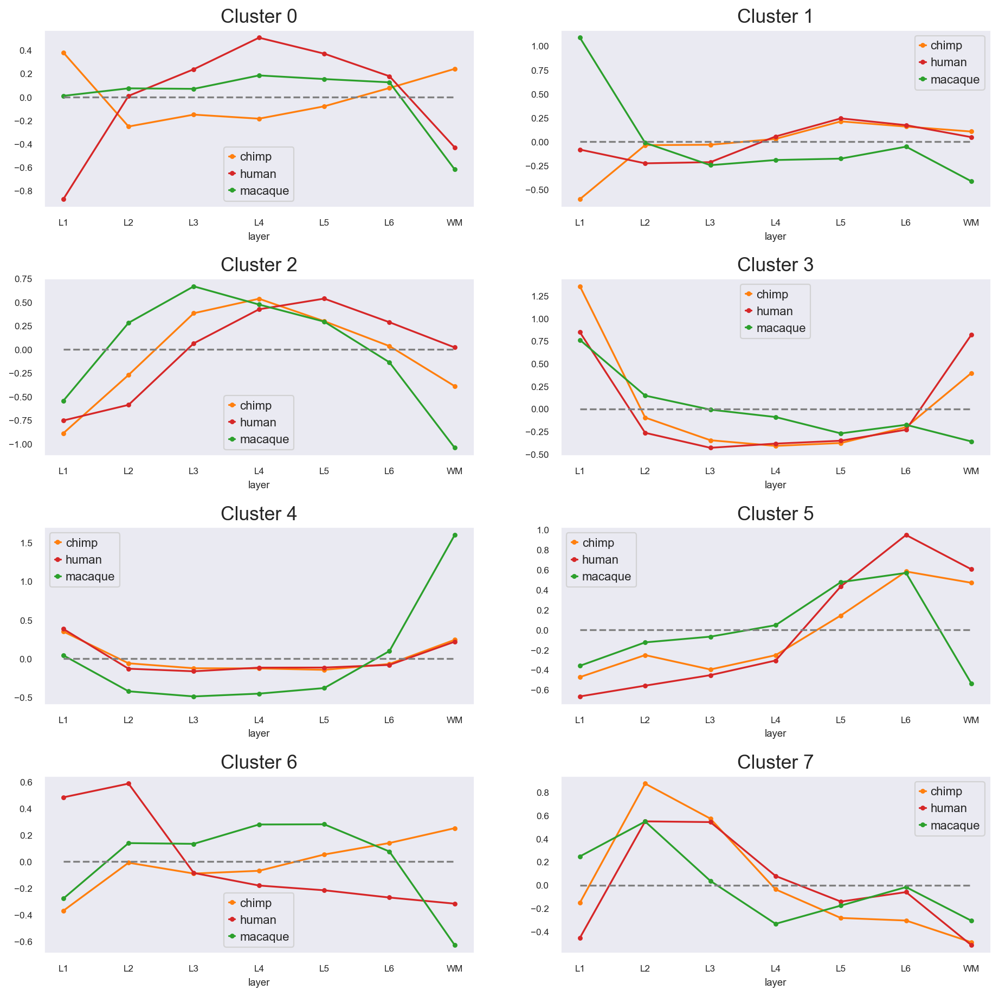

In [35]:
n_rows = (n_clusters // 2 + n_clusters % 2)
fig, axes = plt.subplots(n_rows, 2,  figsize=(14, 3.5 * n_rows), gridspec_kw={'hspace': 0.4})

for label, ax in zip(clusters, axes.flatten()):
    genes = labels[labels == label].index.tolist()

    (
        layer_mean[genes]
        .mean(axis=1)
        .reorder_levels(['layer', 'condition'])
        .unstack().loc[layers]
        .plot
        .line(color={'human': 'tab:red', 'chimp': 'tab:orange', 'macaque': 'tab:green'}, ax=ax, marker='.')
    )
    ax.legend(fontsize=10)
    ax.set_title(f'Cluster {label}', fontsize=16)
    ax.grid(False)
    ax.hlines(0, xmin=0, xmax=6, colors='gray', linestyles='dashed')
plt.savefig(f'figures/snakeplots/snakeplot_layers_mean_only_clusters{n_clusters}.png', bbox_inches='tight')

### 9 clusters

#### Clustering

In [36]:
from sklearn.cluster import SpectralClustering
from sklearn.metrics.pairwise import pairwise_kernels
aff_matrix = pairwise_kernels(df.T, metric='cosine') + 1
n_clusters = 9
clustering = SpectralClustering(n_clusters=n_clusters, gamma=1, affinity='precomputed', random_state=4)
clustering.fit(aff_matrix)

SpectralClustering(affinity='precomputed', gamma=1, n_clusters=9,
                   random_state=4)

In [37]:
cl_order = {i: a for i, a in enumerate([3, 5, 8, 0, 2, 6, 1, 7, 4])}
labels = pd.Series(clustering.labels_, index=df.columns).map(cl_order).sort_values()
order = labels.sort_values().index
labels.to_csv(de_dir_path + f'cluster_spectr_anova_zscore_{n_clusters}.csv')

#### Heatmap

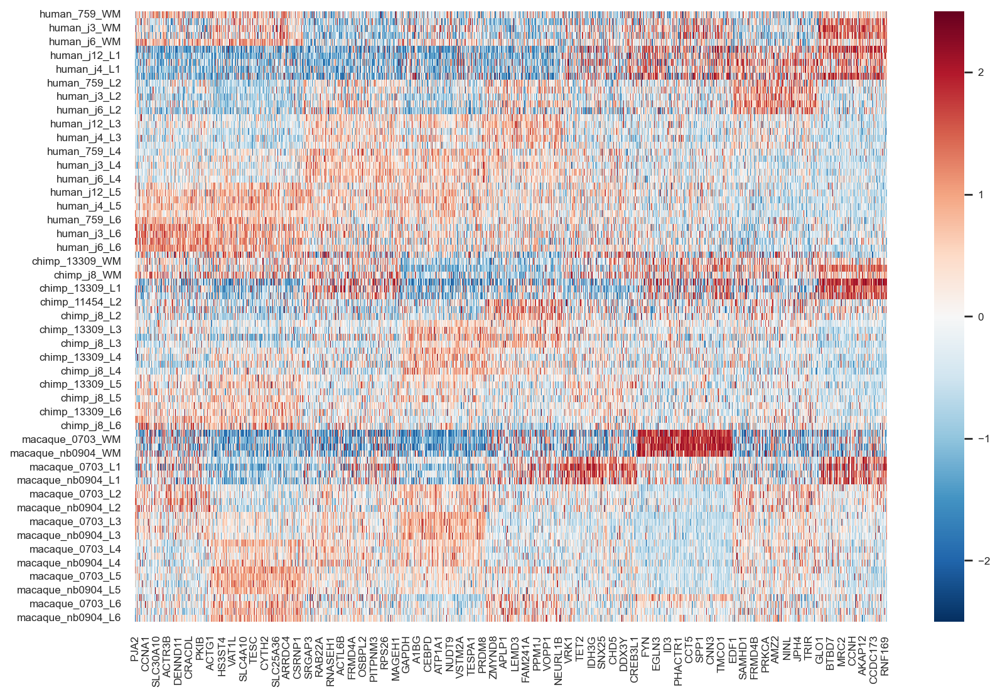

In [38]:
sns.set(font_scale=0.7)
fig, ax = plt.subplots(figsize=(12, 8))
sns.heatmap(df.loc[sample_order['all'], order], ax=ax, cmap="RdBu_r", vmax=2.5, vmin=-2.5, center=0)
plt.savefig(f'figures/heatmaps/heatmap_spectr{n_clusters}_anova.png', bbox_inches='tight')

#### Heatmap for each layer

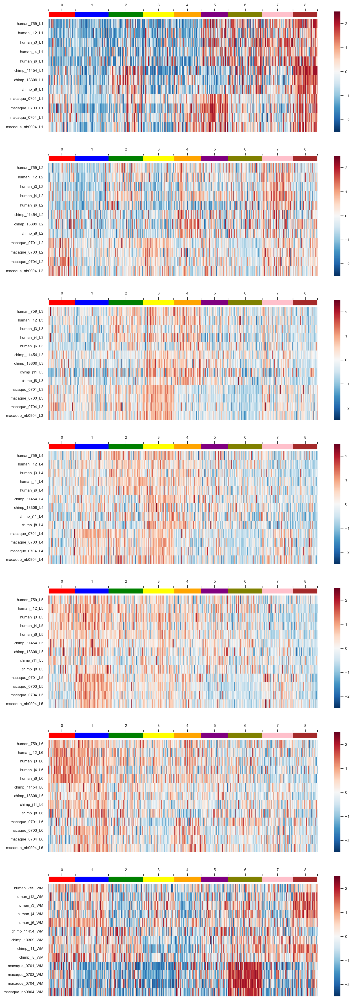

In [39]:
from matplotlib.patches import bbox_artist
from mpl_toolkits.axes_grid1 import make_axes_locatable
from matplotlib import ticker

clusters = np.arange(n_clusters)
colors = cluster_color[:n_clusters]
fig, axes = plt.subplots(7, 1, figsize=(12, 4 * n_clusters), gridspec_kw={'hspace': 0.2})

for ax, layer in zip(axes.flatten(), layers):
    df_layer = df.loc[df.index.str.contains(layer)]
    sns.heatmap(df_layer.loc[:, order], ax=ax, cmap="RdBu_r", vmax=2.5, vmin=-2.5, center=0, xticklabels=False)
    # colorbar
    divider = make_axes_locatable(ax)
    cax = divider.append_axes('top', size='5%', pad=0.05)
    cmap = mpl.colors.ListedColormap(colors)

    cluster_size = labels.value_counts().loc[clusters].values
    cluster_pos = cluster_size.cumsum()
    bounds = [0] + list(cluster_pos)
    norm = mpl.colors.BoundaryNorm(bounds, cmap.N)
    fig.colorbar(
        mpl.cm.ScalarMappable(cmap=cmap, norm=norm),
        cax=cax,
        ticks=bounds,
        orientation='horizontal',
        spacing='proportional'
    )
    cax.xaxis.set_major_locator(ticker.FixedLocator(cluster_pos - cluster_size / 2))
    cax.xaxis.set_major_formatter(ticker.FixedFormatter(clusters))
    cax.xaxis.tick_top()

#### Snakeplot for each layer

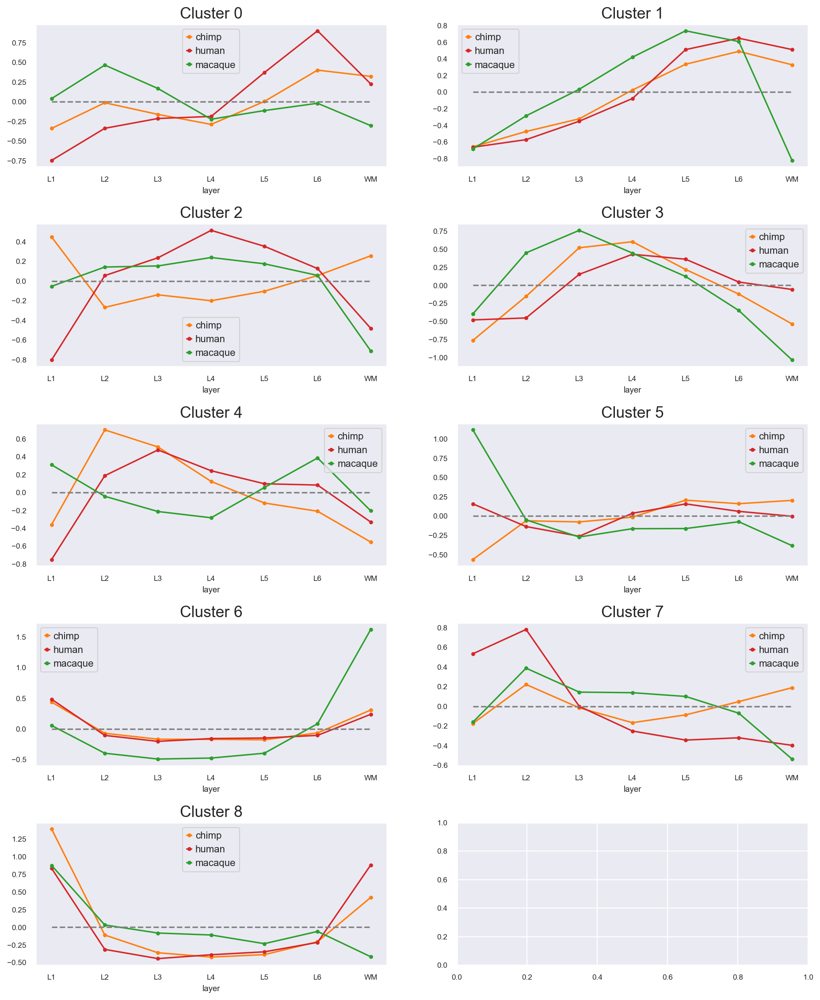

In [40]:
n_rows = (n_clusters // 2 + n_clusters % 2)
fig, axes = plt.subplots(n_rows, 2,  figsize=(14, 3.5 * n_rows), gridspec_kw={'hspace': 0.4})

for label, ax in zip(clusters, axes.flatten()):
    genes = labels[labels == label].index.tolist()

    (
        layer_mean[genes]
        .mean(axis=1)
        .reorder_levels(['layer', 'condition'])
        .unstack().loc[layers]
        .plot
        .line(color={'human': 'tab:red', 'chimp': 'tab:orange', 'macaque': 'tab:green'}, ax=ax, marker='.')
    )
    ax.legend(fontsize=10)
    ax.set_title(f'Cluster {label}', fontsize=16)
    ax.grid(False)
    ax.hlines(0, xmin=0, xmax=6, colors='gray', linestyles='dashed')
plt.savefig(f'figures/snakeplots/snakeplot_layers_mean_only_clusters{n_clusters}.png', bbox_inches='tight')